<a href="https://colab.research.google.com/github/OlgaPodolska/Ukraine_War/blob/main/LGBM_negative.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Installs latest version of TensorFlow 2.X 
!pip install --upgrade tensorflow

In [ ]:
# Import our dependencies
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import datetime
from datetime import datetime
import pandas as pd
port matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn as skl
import tensorflow as tf

In [ ]:
# Find the latest version of spark 3.0 from http://www.apache.org/dist/spark/ and enter as the spark version
# For example:
# spark_version = 'spark-3.0.3'
spark_version = 'spark-3.2.2'
os.environ['SPARK_VERSION']=spark_version

# Install Spark and Java
!apt-get update
!apt-get install openjdk-11-jdk-headless -qq > /dev/null
!wget -q http://www.apache.org/dist/spark/$SPARK_VERSION/$SPARK_VERSION-bin-hadoop2.7.tgz
!tar xf $SPARK_VERSION-bin-hadoop2.7.tgz
!pip install -q findspark

# Set Environment Variables
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-11-openjdk-amd64"
os.environ["SPARK_HOME"] = f"/content/{spark_version}-bin-hadoop2.7"

# Start a SparkSession
import findspark
findspark.init()

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Hit:2 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Get:3 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:4 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:5 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Ign:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:9 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:10 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:13 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Fetched 252 kB in 3s (95.3 kB/s)
Reading package li

In [ ]:
# Add drivers to Spark
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName("CloudETL").config("spark.driver.extraClassPath","/content/postgresql-42.2.16.jar").getOrCreate()

In [ ]:
# Read in data from S3 Buckets
from pyspark import SparkFiles
url ="https://uaresources.s3.us-west-1.amazonaws.com/sentiment_joined_events_twitter_post_ml.csv"

spark.sparkContext.addFile(url)
text_df = spark.read.csv(SparkFiles.get("sentiment_joined_events_twitter_post_ml.csv"), sep=",", header=True, inferSchema=True)


# Show DataFrame
text_df.show()

+---+---------------+---------+---------+-----------+-------------+--------------+------------+--------------------+--------+--------------+----------+---------------+-----------+----------+--------------+-------------+-------+--------------------+--------------------+--------------------+--------------------+
|_c0|       username|following|followers|totaltweets|usercreatedts|tweetcreatedts|retweetcount|            hashtags|language|favorite_count|is_retweet|is_quote_status|extractedts|weekofyear|date_published|search_result| weight|        cleaned_text|            negative|             neutral|            positive|
+---+---------------+---------+---------+-----------+-------------+--------------+------------+--------------------+--------+--------------+----------+---------------+-----------+----------+--------------+-------------+-------+--------------------+--------------------+--------------------+--------------------+
|  0|      WashTimes|   1893.0| 417389.0|   335685.0|   2008-05-

# Cleaning data

In [ ]:
# Convert DataFrame to Pandas
joined_data_df = text_df.toPandas()
print(joined_data_df.shape)
joined_data_df.head(5)

(713009, 22)


,_c0,username,following,followers,totaltweets,usercreatedts,tweetcreatedts,retweetcount,hashtags,language,...,is_quote_status,extractedts,weekofyear,date_published,search_result,weight,cleaned_text,negative,neutral,positive
0,0,WashTimes,1893.0,417389.0,335685.0,2008-05-05,2022-02-26,0.0,"[{'text': 'UkraineCrisis', 'indices': [102, 11...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,democrats urge biden to counter pain at pump w...,0.222473,0.747085,0.030443
1,1,jacarroll,64.0,254.0,110.0,2008-01-07,2022-02-26,0.0,"[{'text': 'StandWithUkriane', 'indices': [58, ...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,now is the time to annex cuba just sayin,0.078324,0.799905,0.121771
2,2,axelk,5766.0,5329.0,119448.0,2007-06-14,2022-02-26,4.0,[],en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,just grasping at straws here but does anyone h...,0.147500,0.824443,0.028057
3,3,ds2719,294.0,172.0,15270.0,2007-07-21,2022-02-26,894.0,[],en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,this is huge russia will be expelled from the ...,0.883955,0.109929,0.006116
4,4,scholar_at_arms,975.0,75.0,1988.0,2008-09-26,2022-02-26,0.0,"[{'text': 'KyivDefiant', 'indices': [18, 30]},...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,please take care,0.063437,0.643451,0.293113


In [ ]:
# Change the dtypes of tweetcreatedts
joined_data_df["tweetcreatedts"] = pd.to_datetime(joined_data_df["tweetcreatedts"])
print (joined_data_df["tweetcreatedts"])

0        2022-02-26
1        2022-02-26
2        2022-02-26
3        2022-02-26
4        2022-02-26
            ...    
713004   2022-02-26
713005   2022-02-26
713006   2022-02-26
713007   2022-02-26
713008          NaT
Name: tweetcreatedts, Length: 713009, dtype: datetime64[ns]


In [ ]:
# drop the row with NaT values in the tweetcreatedts column
joined_data_df = joined_data_df.dropna(axis=0, subset=['tweetcreatedts']) 

joined_data_df.shape

(713008, 22)

In [ ]:
# Drop the not meaningful for prediction columns
joined_data_df.drop("_c0", axis=1, inplace=True)
joined_data_df.drop("username", axis=1, inplace=True)
joined_data_df.drop("usercreatedts", axis=1, inplace=True)
joined_data_df.drop("language", axis=1, inplace=True)
joined_data_df.drop("extractedts", axis=1, inplace=True)
joined_data_df.drop("weekofyear", axis=1, inplace=True)
joined_data_df.drop("search_result", axis=1, inplace=True)
joined_data_df.drop("date_published", axis=1, inplace=True)

In [ ]:
# convert text to text lenght and drop the text
joined_data_df['text_length']  = joined_data_df['cleaned_text'].str.len()
joined_data_df.drop("cleaned_text", axis=1, inplace=True)

In [ ]:
# Change object type to boolean for columns 'is_retweet' and 'is_quote_status'
joined_data_df["is_retweet"] = joined_data_df['is_retweet'].astype(bool)
joined_data_df["is_quote_status"] = joined_data_df['is_quote_status'].astype(bool)
# Replace boolean columns
joined_data_df['is_retweet'] = joined_data_df['is_retweet'].astype(int)
joined_data_df['is_quote_status'] = joined_data_df['is_quote_status'].astype(int)
joined_data_df.head()

,following,followers,totaltweets,tweetcreatedts,retweetcount,hashtags,favorite_count,is_retweet,is_quote_status,weight,negative,neutral,positive,text_length
0,1893.0,417389.0,335685.0,2022-02-26,0.0,"[{'text': 'UkraineCrisis', 'indices': [102, 11...",0.0,0,0,0.000533,0.222473,0.747085,0.030443,77.0
1,64.0,254.0,110.0,2022-02-26,0.0,"[{'text': 'StandWithUkriane', 'indices': [58, ...",0.0,0,0,0.000533,0.078324,0.799905,0.121771,40.0
2,5766.0,5329.0,119448.0,2022-02-26,4.0,[],0.0,0,0,0.000533,0.147500,0.824443,0.028057,138.0
3,294.0,172.0,15270.0,2022-02-26,894.0,[],0.0,0,0,0.000533,0.883955,0.109929,0.006116,220.0
4,975.0,75.0,1988.0,2022-02-26,0.0,"[{'text': 'KyivDefiant', 'indices': [18, 30]},...",0.0,0,0,0.000533,0.063437,0.643451,0.293113,16.0


In [ ]:
# Lowercase everything in the hashtags column
joined_data_df["hashtags"] = joined_data_df["hashtags"].str.lower()

# Delete unnesessary signs in the hashtags
joined_data_df["hashtags"] = joined_data_df["hashtags"].str.replace("[0-9]", "")
joined_data_df["hashtags"] = joined_data_df["hashtags"].str.replace("text", "")
joined_data_df["hashtags"] = joined_data_df["hashtags"].str.replace("indices", "")
joined_data_df["hashtags"] = joined_data_df["hashtags"].str.replace("\W", "")

joined_data_df["hashtags"].value_counts()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning:

The default value of regex will change from True to False in a future version.



                                                                             108312
ukraine                                                                       88981
russia                                                                        20550
mariupol                                                                      14395
standwithukraine                                                              13391
                                                                              ...  
chemicalweaponsuaenatousa                                                         1
putinswarcrimesputinpropagandawarcrimesrussianwarcrimesstandwithukraine           1
jpmorganceoannualletterheretakeawayscovideconomyinflationukraineeconomics         1
nowarstopputinstopputinnow                                                        1
ukraniarussiarussiaukraineconflictukrainerussiawar                                1
Name: hashtags, Length: 136805, dtype: int64

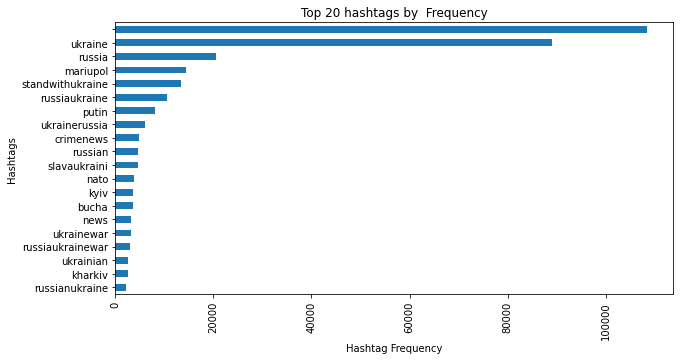

In [ ]:
# Find the top 20 hashtags by frequency
plt.figure(figsize=(10,5))
joined_data_df["hashtags"].value_counts().sort_values(ascending=True)[-20:].plot.barh();
plt.title("Top 20 hashtags by  Frequency")
plt.xlabel("Hashtag Frequency")
plt.ylabel("Hashtags")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()
plt.show()

In [ ]:
# Count hashtags
joined_data_df["hashtags"].nunique()

136805

In [ ]:
#Create labels for hashtags

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
joined_data_df = joined_data_df.copy()
joined_data_df['hashtags'] = le.fit_transform(joined_data_df['hashtags'])
joined_data_df.head()

,following,followers,totaltweets,tweetcreatedts,retweetcount,hashtags,favorite_count,is_retweet,is_quote_status,weight,negative,neutral,positive,text_length
0,1893.0,417389.0,335685.0,2022-02-26,0.0,108176,0.0,0,0,0.000533,0.222473,0.747085,0.030443,77.0
1,64.0,254.0,110.0,2022-02-26,0.0,97752,0.0,0,0,0.000533,0.078324,0.799905,0.121771,40.0
2,5766.0,5329.0,119448.0,2022-02-26,4.0,0,0.0,0,0,0.000533,0.147500,0.824443,0.028057,138.0
3,294.0,172.0,15270.0,2022-02-26,894.0,0,0.0,0,0,0.000533,0.883955,0.109929,0.006116,220.0
4,975.0,75.0,1988.0,2022-02-26,0.0,45096,0.0,0,0,0.000533,0.063437,0.643451,0.293113,16.0


In [ ]:
# Check data types
joined_data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 713008 entries, 0 to 713007
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   following        713008 non-null  float64       
 1   followers        713008 non-null  float64       
 2   totaltweets      713008 non-null  float64       
 3   tweetcreatedts   713008 non-null  datetime64[ns]
 4   retweetcount     713008 non-null  float64       
 5   hashtags         713008 non-null  int64         
 6   favorite_count   713008 non-null  float64       
 7   is_retweet       713008 non-null  int64         
 8   is_quote_status  713008 non-null  int64         
 9   weight           710366 non-null  float64       
 10  negative         713008 non-null  float64       
 11  neutral          713008 non-null  float64       
 12  positive         713008 non-null  float64       
 13  text_length      712997 non-null  float64       
dtypes: datetime64[ns](1)

In [ ]:
# Convert datetime to float

# save the dataframe before converting time
time_df = joined_data_df

# time_df["tweetcreatedts"] = pd.to_numeric(joined_data_df.index, downcast='float')

joined_data_df['tweetcreatedts'] = joined_data_df['tweetcreatedts'].astype(str)
joined_data_df['tweetcreatedts'] = joined_data_df['tweetcreatedts'].str.replace('-', '')
joined_data_df['tweetcreatedts'] = joined_data_df['tweetcreatedts'].astype(float)
print(joined_data_df["tweetcreatedts"])

0         20220226.0
1         20220226.0
2         20220226.0
3         20220226.0
4         20220226.0
             ...    
713003    20220226.0
713004    20220226.0
713005    20220226.0
713006    20220226.0
713007    20220226.0
Name: tweetcreatedts, Length: 713008, dtype: float64


In [ ]:
#Check the null values
for column in joined_data_df.columns:
    print(f'Column {column} has {joined_data_df[column].isnull().sum()} null values')
joined_data_df.shape

Column following has 0 null values
Column followers has 0 null values
Column totaltweets has 0 null values
Column tweetcreatedts has 0 null values
Column retweetcount has 0 null values
Column hashtags has 0 null values
Column favorite_count has 0 null values
Column is_retweet has 0 null values
Column is_quote_status has 0 null values
Column weight has 2642 null values
Column negative has 0 null values
Column neutral has 0 null values
Column positive has 0 null values
Column text_length has 11 null values


(713008, 14)

In [ ]:
# Drop null values from August 12 till 18
joined_data_df = joined_data_df.dropna()
joined_data_df.shape

(710355, 14)

# Cluster the data

As wee can see, the each tweet has the positive, negative and neutral score. But clearly we can and should make classification: is the whole tweet negative ot positive? Let's divide the tweets: if negative score is biggest, we count that tweet as negative, and if positive score is biggest - as positive.

In [ ]:
# Create new label for tweets as negative, positive and neutral

joined_data_df.loc[joined_data_df['negative'] <= joined_data_df['positive'], 'negative'] = 0
joined_data_df.loc[joined_data_df['negative'] <= joined_data_df['neutral'], 'negative'] = 0
joined_data_df.loc[(joined_data_df['negative'] > joined_data_df['positive']) 
& (joined_data_df['negative'] > joined_data_df['neutral']), 'negative'] = 1 

joined_data_df.loc[joined_data_df['positive'] <= joined_data_df['negative'], 'positive'] = 0
joined_data_df.loc[joined_data_df['positive'] <= joined_data_df['neutral'], 'positive'] = 0
joined_data_df.loc[(joined_data_df['positive'] > joined_data_df['negative']) 
& (joined_data_df['positive'] > joined_data_df['neutral']), 'positive'] = 1 

joined_data_df.loc[joined_data_df['neutral'] <= joined_data_df['negative'], 'neutral'] = 0
joined_data_df.loc[joined_data_df['neutral'] <= joined_data_df['positive'], 'neutral'] = 0
joined_data_df.loc[(joined_data_df['neutral'] > joined_data_df['negative']) 
& (joined_data_df['neutral'] > joined_data_df['positive']), 'neutral'] = 1 

# Create new dataframe for cluster column
clustered_data_df = joined_data_df

clustered_data_df.loc[clustered_data_df['negative'] == 1, 'class'] = 1
clustered_data_df.loc[clustered_data_df['positive'] == 1, 'class'] = 2
clustered_data_df.loc[clustered_data_df['neutral'] == 1, 'class'] = 3

clustered_data_df.head()



/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1684: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,following,followers,totaltweets,tweetcreatedts,retweetcount,hashtags,favorite_count,is_retweet,is_quote_status,weight,negative,neutral,positive,text_length,class
0,1893.0,417389.0,335685.0,20220226.0,0.0,108176,0.0,0,0,0.000533,0.0,1.0,0.0,77.0,3.0
1,64.0,254.0,110.0,20220226.0,0.0,97752,0.0,0,0,0.000533,0.0,1.0,0.0,40.0,3.0
2,5766.0,5329.0,119448.0,20220226.0,4.0,0,0.0,0,0,0.000533,0.0,1.0,0.0,138.0,3.0
3,294.0,172.0,15270.0,20220226.0,894.0,0,0.0,0,0,0.000533,1.0,0.0,0.0,220.0,1.0
4,975.0,75.0,1988.0,20220226.0,0.0,45096,0.0,0,0,0.000533,0.0,1.0,0.0,16.0,3.0


In [ ]:

import plotly.express as px
fig = px.scatter_3d(
    clustered_data_df,
    x="tweetcreatedts",
    y="totaltweets",
    z="hashtags",
    color="class",
    symbol="class",
    width=800,
)
fig.update_layout(legend=dict(x=0, y=1))
fig.show()

# Scale the data


In [ ]:
# Create the StandardScaler instance
scaler = StandardScaler()

# Fit the StandardScaler
scaler.fit(joined_data_df)

# Scale the data
scaled_data = scaler.transform(joined_data_df)

# Create a DataFrame with the scaled data
transformed_scaled_data = pd.DataFrame(scaled_data, columns=clustered_data_df.columns)
transformed_scaled_data.head(5)

,following,followers,totaltweets,tweetcreatedts,retweetcount,hashtags,favorite_count,is_retweet,is_quote_status,weight,negative,neutral,positive,text_length,class
0,-0.177340,0.689392,1.330729,-1.578197,-0.186137,1.019357,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256,1.098622,-0.383888,-0.925411,1.034739
1,-0.298441,-0.101081,-0.678497,-1.578197,-0.186137,0.777848,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256,1.098622,-0.383888,-1.446835,1.034739
2,0.079098,-0.091464,0.036029,-1.578197,-0.185347,-1.486933,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256,1.098622,-0.383888,-0.065765,1.034739
3,-0.283213,-0.101236,-0.587728,-1.578197,-0.009618,-1.486933,-0.038117,-0.645473,-0.222816,-0.78303,1.178889,-0.910232,-0.383888,1.089825,-1.109046
4,-0.238122,-0.101420,-0.667253,-1.578197,-0.186137,-0.442120,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256,1.098622,-0.383888,-1.785056,1.034739


In [ ]:
# Find the correlation between variables

df_corr = transformed_scaled_data.corr()['negative'][2:-1]
top_features = df_corr.sort_values(ascending=False)
top_features

negative           1.000000
text_length        0.234765
is_retweet         0.033050
is_quote_status    0.016422
weight            -0.003461
favorite_count    -0.005526
retweetcount      -0.020044
tweetcreatedts    -0.022428
hashtags          -0.033956
totaltweets       -0.037452
positive          -0.325635
neutral           -0.772109
Name: negative, dtype: float64

Taking the numerical representation of the correlation, we see that the correlation is fairly low, with some of them being negative.

Clearly, if we know if the tweet was labeled as positive or neitral, we 100% can predict if the current tweet is negative with 100% accuracy without any machine learning. Let's make it harder and drop this columns too.

In [ ]:
# Drop the columns without correlation

transformed_scaled_data.drop("following", axis=1, inplace=True)
transformed_scaled_data.drop("followers", axis=1, inplace=True)
transformed_scaled_data.drop("text_length", axis=1, inplace=True)
transformed_scaled_data.drop("class", axis=1, inplace=True)
transformed_scaled_data.drop("neutral", axis=1, inplace=True)
transformed_scaled_data.drop("positive", axis=1, inplace=True)

transformed_scaled_data.head(5)

,totaltweets,tweetcreatedts,retweetcount,hashtags,favorite_count,is_retweet,is_quote_status,weight,negative
0,1.330729,-1.578197,-0.186137,1.019357,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256
1,-0.678497,-1.578197,-0.186137,0.777848,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256
2,0.036029,-1.578197,-0.185347,-1.486933,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256
3,-0.587728,-1.578197,-0.009618,-1.486933,-0.038117,-0.645473,-0.222816,-0.78303,1.178889
4,-0.667253,-1.578197,-0.186137,-0.442120,-0.038117,-0.645473,-0.222816,-0.78303,-0.848256


# Create a base LGBM Classifier model to predict if tweet will be negative

In [ ]:
#!pip install lightgbm
import lightgbm as lgb
import seaborn as sns

from sklearn import preprocessing
from sklearn import utils

# Declare feature vector and target variable
X = transformed_scaled_data.drop(['negative'], 1)
y = transformed_scaled_data['negative']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



In [ ]:
#convert y values to categorical values
lab = preprocessing.LabelEncoder()
y = lab.fit_transform(y)

#view transformed values
print(y)

[0 0 0 ... 0 0 1]


In [ ]:
# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
print('Training set shape ', X_train.shape)
print('Training set shape ', y_train.shape)
print('Test set shape ', X_test.shape)
print('Test set shape ', y_test.shape)

Training set shape  (497248, 8)
Training set shape  (497248,)
Test set shape  (213107, 8)
Test set shape  (213107,)


In [ ]:
# Create scaler instance
clf = lgb.LGBMClassifier()
clf.fit(X_train, y_train)

LGBMClassifier()

In [ ]:
# predict the results
y_pred=clf.predict(X_test)

In [ ]:
# view accuracy
from sklearn.metrics import accuracy_score
accuracy=accuracy_score(y_pred, y_test)
print('LightGBM Model accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

LightGBM Model accuracy score: 0.6501


# Compare train and test set accuracy

In [ ]:
y_pred_train = clf.predict(X_train)

print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.6527


In [ ]:
#Check for overfitting

# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf.score(X_test, y_test)))

Training set score: 0.6527
Test set score: 0.6501


In [ ]:
# view confusion-matrix
# Print the Confusion Matrix and slice it into four pieces

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[107622  16376]
 [ 58187  30922]]

True Positives(TP) =  107622

True Negatives(TN) =  30922

False Positives(FP) =  16376

False Negatives(FN) =  58187


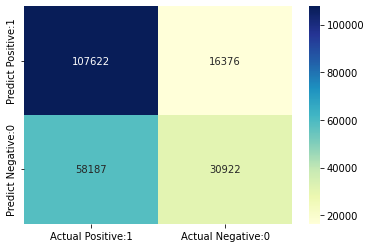

In [ ]:
# visualize confusion matrix with seaborn heatmap

cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.87      0.74    123998
           1       0.65      0.35      0.45     89109

    accuracy                           0.65    213107
   macro avg       0.65      0.61      0.60    213107
weighted avg       0.65      0.65      0.62    213107

